In [1]:
import pandas as pd
import requests
import datetime as dt

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import warnings 
pd.options.mode.chained_assignment = None # se desactiva advertencias de pandas por la edición_sobrescritura

**Datos contaminacón NYC**

URL https://data.cityofnewyork.us/Environment/Air-Quality/c3uy-2p5r <br>
API "https://data.cityofnewyork.us/resource/c3uy-2p5r.json"

In [4]:
# Se extrae de la API

url="https://data.cityofnewyork.us/resource/c3uy-2p5r.json"

# Parámetros de paginación
limit = 1000  # Número máximo de resultados por página
offset = 0    # Número de resultados a omitir antes de comenzar a obtener resultados
results = []  # Lista para almacenar los resultados

while True:
    # Construir la URL con los parámetros de paginación
    query_url = f'{url}?$limit={limit}&$offset={offset}'
    
    # Leer los datos de la URL en un DataFrame
    df = pd.read_json(query_url)
    
    # Agregar los resultados al DataFrame
    results.append(df)
    
    # Verificar si hay más resultados
    if len(df) < limit:
        break  # Si no hay más resultados, salir del ciclo
    
    offset += limit  # Incrementar el offset para la próxima página

# Se concatenan todos los DataFrames en uno solo
df_final = pd.concat(results, ignore_index=True)

In [151]:
df_final

,unique_id,indicator_id,name,measure,measure_info,geo_type_name,geo_join_id,geo_place_name,time_period,start_date,data_value
0,216498,386,Ozone (O3),Mean,ppb,CD,313,Coney Island (CD13),Summer 2013,2013-06-01,34.64
1,216499,386,Ozone (O3),Mean,ppb,CD,313,Coney Island (CD13),Summer 2014,2014-06-01,33.22
2,219969,386,Ozone (O3),Mean,ppb,Borough,1,Bronx,Summer 2013,2013-06-01,31.25
3,219970,386,Ozone (O3),Mean,ppb,Borough,1,Bronx,Summer 2014,2014-06-01,31.15
4,164876,383,Sulfur Dioxide (SO2),Mean,ppb,CD,211,Morris Park and Bronxdale (CD11),Winter 2008-09,2008-12-01,5.89
...,...,...,...,...,...,...,...,...,...,...,...
16117,671118,386,Ozone (O3),Mean,ppb,CD,306,Park Slope and Carroll Gardens (CD6),Summer 2020,2020-06-01,28.70
16118,671119,386,Ozone (O3),Mean,ppb,CD,305,East New York and Starrett City (CD5),Summer 2020,2020-06-01,29.56
16119,671120,386,Ozone (O3),Mean,ppb,CD,304,Bushwick (CD4),Summer 2020,2020-06-01,29.65
16120,671121,386,Ozone (O3),Mean,ppb,CD,303,Bedford Stuyvesant (CD3),Summer 2020,2020-06-01,29.28


In [152]:
df=df_final

El dataset presenta diferentes clasificaciones en La columna 'geo_type_name' la cual determina las áreas de la ciudad. Para el análisis del EDA se usa **CD**. Equivalente a community districts.

In [153]:
# Se modifica la fecha en 'start_date'

df['start_date'] = pd.to_datetime(df['start_date'])

# Se eliminan columnas 
df = df.drop(['unique_id', 'indicator_id'], axis=1)

print(f"Se selecciona CD con 5900 datos \n{df['geo_type_name'].value_counts()}")

df=df[df['geo_type_name'] == 'CD']

df=df.reset_index(drop=True) #reset de índice.  

df.head(3)


Se selecciona CD con 5900 datos 
UHF42       6216
CD          5900
UHF34       3128
Borough      730
Citywide     148
Name: geo_type_name, dtype: int64


,name,measure,measure_info,geo_type_name,geo_join_id,geo_place_name,time_period,start_date,data_value
0,Ozone (O3),Mean,ppb,CD,313,Coney Island (CD13),Summer 2013,2013-06-01,34.64
1,Ozone (O3),Mean,ppb,CD,313,Coney Island (CD13),Summer 2014,2014-06-01,33.22
2,Sulfur Dioxide (SO2),Mean,ppb,CD,211,Morris Park and Bronxdale (CD11),Winter 2008-09,2008-12-01,5.89


In [8]:
df.dtypes

name                      object
measure                   object
measure_info              object
geo_type_name             object
geo_join_id                int64
geo_place_name            object
time_period               object
start_date        datetime64[ns]
data_value               float64
dtype: object

In [9]:
df['name'].value_counts()

Nitrogen Dioxide (NO2)                                            2124
Fine Particulate Matter (PM2.5)                                   2124
Ozone (O3)                                                         708
Sulfur Dioxide (SO2)                                               472
Traffic Density- Annual Vehicle Miles Traveled                     118
Traffic Density- Annual Vehicle Miles Traveled for Trucks          118
Traffic Density- Annual Vehicle Miles Traveled for Cars            118
Air Toxics Concentrations- Average Formaldehyde Concentrations      59
Air Toxics Concentrations- Average Benzene Concentrations           59
Name: name, dtype: int64

In [154]:
# Se renombran categorías 

# Fine Particulate Matter (PM2.5)
df['name'] = df['name'].apply(lambda x: "PM 2.5 (µg/cm3)" if 'Fine Particulate Matter (PM2.5)' in x else  x)

# Nitrogen Dioxide (NO2)
df['name'] = df['name'].apply(lambda x: "NO2 (ppb)" if 'Nitrogen Dioxide (NO2)' in x else  x)

# Sulfur Dioxide (SO2)
df['name'] = df['name'].apply(lambda x: "SO2 (ppb)" if 'Sulfur Dioxide (SO2)' in x else  x)

# Avg Benzene 
df['name'] = df['name'].apply(lambda x: "O3 (ppb)" if 'Ozone (O3)' in x else  x)

# Avg Benzene 
df['name'] = df['name'].apply(lambda x: "Benzene (ppb)" if 'Average Benzene Concentrations' in x else  x)

# Avg Formaldehyde 
df['name'] = df['name'].apply(lambda x: "Formaldehyde (ppb)" if 'Formaldehyde Concentrations' in x else  x)



df['name'].value_counts()

NO2 (ppb)                                                    2124
PM 2.5 (µg/cm3)                                              2124
O3 (ppb)                                                      708
SO2 (ppb)                                                     472
Traffic Density- Annual Vehicle Miles Traveled                118
Traffic Density- Annual Vehicle Miles Traveled for Trucks     118
Traffic Density- Annual Vehicle Miles Traveled for Cars       118
Formaldehyde (ppb)                                             59
Benzene (ppb)                                                  59
Name: name, dtype: int64

In [155]:
# Community Districts New york

brooklyn = ["South Crown Heights and Lefferts Gardens (CD9)","Sunset Park (CD7)","Sheepshead Bay (CD15)",
"Park Slope and Carroll Gardens (CD6)", "Greenpoint and Williamsburg (CD1)", "Fort Greene and Brooklyn Heights (CD2)",
"Flatlands and Canarsie (CD18)","Flatbush and Midwood (CD14)","East New York and Starrett City (CD5)","East Flatbush (CD17)",
"Crown Heights and Prospect Heights (CD8)", "Coney Island (CD13)","Bushwick (CD4)","Brownsville (CD16)",
"Borough Park (CD12)","Bensonhurst (CD11)","Bedford Stuyvesant (CD3)", "Bay Ridge and Dyker Heights (CD10)"]

manhattan = ["Financial District (CD1)", "Greenwich Village and Soho (CD2)","Lower East Side and Chinatown (CD3)",
    "Clinton and Chelsea (CD4)","Midtown (CD5)","Stuyvesant Town and Turtle Bay (CD6)","Upper West Side (CD7)",
    "Upper East Side (CD8)","Morningside Heights and Hamilton Heights (CD9)","Central Harlem (CD10)","East Harlem (CD11)",
    "Washington Heights and Inwood (CD12)"]

queens = ["Long Island City and Astoria (CD1)","Woodside and Sunnyside (CD2)","Elmhurst and Corona (CD4)",
    "Ridgewood and Maspeth (CD5)","Rego Park and Forest Hills (CD6)","Flushing and Whitestone (CD7)",
    "Hillcrest and Fresh Meadows (CD8)","Kew Gardens and Woodhaven (CD9)","South Ozone Park and Howard Beach (CD10)",
    "Bayside and Little Neck (CD11)","Jamaica and Hollis (CD12)","Queens Village (CD13)", "Rockaway and Broad Channel (CD14)",
    "Jackson Heights (CD3)"]

state_island = ["St. George and Stapleton (CD1)","Tottenville and Great Kills (CD3)","South Beach and Willowbrook (CD2)"]

the_bronx = ["Morrisania and Crotona (CD3)", "Highbridge and Concourse (CD4)", "Hunts Point and Longwood (CD2)",
              "Morris Park and Bronxdale (CD11)", "Parkchester and Soundview (CD9)","Williamsbridge and Baychester (CD12)",
              "Belmont and East Tremont (CD6)", "Kingsbridge Heights and Bedford (CD7)", "Riverdale and Fieldston (CD8)",
              "Throgs Neck and Co-op City (CD10)","Mott Haven and Melrose (CD1)", "Fordham and University Heights (CD5)"]


In [156]:
# Se crea la nueva columna y se asigna el valor correspondiente a cada borough

df['borough'] = df['geo_place_name'].apply(lambda x:'brooklyn' if x in brooklyn else 
                                                          ('manhattan' if x in manhattan else 
                                                          ('queens' if x in queens else 
                                                          ('staten_island' if x in state_island else 
                                                          ('the_bronx' if  x in the_bronx else None)))))


In [157]:
df.sample(3)

,name,measure,measure_info,geo_type_name,geo_join_id,geo_place_name,time_period,start_date,data_value,borough
4595,NO2 (ppb),Mean,ppb,CD,313,Coney Island (CD13),Winter 2016-17,2016-12-01,22.23,brooklyn
1668,PM 2.5 (µg/cm3),Mean,mcg per cubic meter,CD,202,Hunts Point and Longwood (CD2),Summer 2009,2009-06-01,11.49,the_bronx
4394,PM 2.5 (µg/cm3),Mean,mcg per cubic meter,CD,407,Flushing and Whitestone (CD7),Annual Average 2017,2017-01-01,7.30,queens


# Dataset 1  Calidad del aire
### 1. Cargas Contaminantes

In [14]:
df['name'].value_counts()

NO2 (ppb)                                                    2124
PM 2.5 (µg/cm3)                                              2124
O3 (ppb)                                                      708
SO2 (ppb)                                                     472
Traffic Density- Annual Vehicle Miles Traveled                118
Traffic Density- Annual Vehicle Miles Traveled for Trucks     118
Traffic Density- Annual Vehicle Miles Traveled for Cars       118
Formaldehyde (ppb)                                             59
Benzene (ppb)                                                  59
Name: name, dtype: int64

In [158]:
# Se elimina las filas de trafico del dataset

CD_air = df[df['name'] != 'Traffic Density- Annual Vehicle Miles Traveled for Cars']
CD_air = CD_air[CD_air['name'] != 'Traffic Density- Annual Vehicle Miles Traveled']
CD_air = CD_air[CD_air['name'] != 'Traffic Density- Annual Vehicle Miles Traveled for Trucks']

CD_air = CD_air.reset_index(drop=True)


In [16]:
# se valida tipo de datos
CD_air.dtypes


name                      object
measure                   object
measure_info              object
geo_type_name             object
geo_join_id                int64
geo_place_name            object
time_period               object
start_date        datetime64[ns]
data_value               float64
borough                   object
dtype: object

In [137]:
CD_air.sample(3)

,name,measure,measure_info,geo_type_name,geo_join_id,geo_place_name,time_period,start_date,data_value,borough
4616,PM 2.5 (µg/cm3),Mean,mcg per cubic meter,CD,301,Greenpoint and Williamsburg (CD1),Summer 2018,2018-06-01,10.01,brooklyn
5017,PM 2.5 (µg/cm3),Mean,mcg per cubic meter,CD,317,East Flatbush (CD17),Annual Average 2019,2019-01-01,6.43,brooklyn
1728,PM 2.5 (µg/cm3),Mean,mcg per cubic meter,CD,204,Highbridge and Concourse (CD4),Summer 2013,2013-06-01,11.06,the_bronx


In [159]:
# Se elimina columna 'time_period' 
CD_air = CD_air.drop(['measure','geo_type_name','time_period', 'measure_info'], axis=1)

# Se renombra columnas
CD_air.columns=['carga_cont', 'geo_id_cd','cd_name','date','data_value','borough']

#Se Reordenan las columnas
CD_air = CD_air.iloc[:,[1,2,5,3,0,4]]

CD_air.sample(5)

,geo_id_cd,cd_name,borough,date,carga_cont,data_value
4793,301,Greenpoint and Williamsburg (CD1),brooklyn,2019-06-01,NO2 (ppb),19.20
2210,212,Williamsbridge and Baychester (CD12),the_bronx,2014-06-01,NO2 (ppb),14.83
3040,306,Park Slope and Carroll Gardens (CD6),brooklyn,2014-12-01,PM 2.5 (µg/cm3),10.03
2766,407,Flushing and Whitestone (CD7),queens,2009-06-01,O3 (ppb),26.29
5444,403,Jackson Heights (CD3),queens,2020-06-01,PM 2.5 (µg/cm3),7.12


In [19]:
CD_air['data_value'].describe()

count    5546.000000
mean       16.058085
std         9.582474
min         0.110000
25%         8.630000
50%        13.155000
75%        24.237500
max        50.560000
Name: data_value, dtype: float64

**Material Particulado PM 2.5**

In [160]:
CD_air_pm=CD_air[CD_air['carga_cont'] == "PM 2.5 (µg/cm3)"]
CD_air_pm = CD_air_pm.groupby(['borough', 'date']).data_value.mean().reset_index()

In [161]:
CD_air_pm.sample(3)

,borough,date,data_value
109,staten_island,2017-01-01,6.840000
141,the_bronx,2017-12-01,8.400833
43,manhattan,2015-01-01,10.259167


**Nitrogen Dioxide (NO2)**

In [22]:
CD_air_no2=CD_air[CD_air['carga_cont'] == "NO2 (ppb)"]

CD_air_no2 = CD_air_no2.groupby(['borough', 'date']).data_value.mean().reset_index()
CD_air_no2.sample(2)

,borough,date,data_value
46,manhattan,2015-12-31,24.725833
3,brooklyn,2010-06-01,18.924444


**Ozone (O3)**

In [23]:
CD_air_o3=CD_air[CD_air['carga_cont'] == "O3 (ppb)"]

CD_air_o3 = CD_air_o3.groupby(['borough', 'date']).data_value.mean().reset_index()
CD_air_o3.sample(2)

,borough,date,data_value
5,brooklyn,2014-06-01,30.974444
0,brooklyn,2009-06-01,25.750556


**Sulfur Dioxide (SO2)**

In [24]:
CD_air_so2=CD_air[CD_air['carga_cont'] == "SO2 (ppb)"]
CD_air_so2 = CD_air_so2.groupby(['borough', 'date']).data_value.mean().reset_index()
CD_air_so2.sample(2)

,borough,date,data_value
2,brooklyn,2010-12-01,3.409444
35,the_bronx,2011-12-01,3.897500


In [25]:
# graficas

sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"}) # Formato para el Backgound del grafico


# Se crea Subplot de 2*2
fig, ax = plt.subplots(2, 2, figsize=(20, 12),dpi=800)

# grafica1 PM 2.5

sns.lineplot(x="date", y="data_value", data=CD_air_pm,  hue='borough', ax=ax[0,0],  markers=True, palette="magma")
    # etiquetas & ejes
ax[0,0].set_xlabel('años')
ax[0,0].set_ylabel('PM 2.5 µg / cm3')
ax[0,0].set_title('Carga Contaminante Material Particulado de 2.5 micras')
    # Leyenda
ax[0,0].legend(title='Borough', loc='upper right', bbox_to_anchor=(1.05, 1)) 

# grafica2 NO2

sns.lineplot(x="date", y="data_value", data=CD_air_no2,  hue='borough', ax=ax[0,1], markers=True, palette="magma")
   # etiquetas & ejes
ax[0,1].set_xlabel('años')
ax[0,1].set_ylabel('NO2 ppb')
ax[0,1].set_title('Carga Contaminante Dióxido de Nitrógeno')
 # Leyenda
ax[0,1].legend(title='Borough', loc='upper right', bbox_to_anchor=(1.05, 1)) 

# grafica3 Ozono O3

sns.lineplot(x="date", y="data_value", data=CD_air_o3,  hue='borough', ax=ax[1,0], markers=True,   palette="magma")
    # etiquetas & ejes
ax[1,0].set_xlabel('años')
ax[1,0].set_ylabel('O3 ppb')
ax[1,0].set_title('Carga Contaminante Ozono')
 # Leyenda
ax[1,0].legend(title='Borough', loc='upper right', bbox_to_anchor=(1.05, 1)) 

# grafica4 Dioxido de Azufre

sns.lineplot(x="date", y="data_value", data=CD_air_so2,  hue='borough', ax=ax[1,1], markers=True,   palette="magma")
    # etiquetas & ejes
ax[1,1].set_xlabel('años')
ax[1,1].set_ylabel('SO2 ppb')
ax[1,1].set_title('Carga Contaminante Dioxido de Azufre')
 # Leyenda
ax[1,1].legend(title='Borough', loc='upper right', bbox_to_anchor=(1.05, 1)) 


plt.show()


## 2. Indice de Calidad del Aire

Se valida la calidad del aire con el contaminante PM2.5 acorde a la clasificación generada por  [IQAIR](https://www.iqair.com/es/newsroom/what-is-aqi) basado en los NAAQS (National Ambient Air Quality Standards) de la EPA (Environmental Protection Agency) de EE. UU. <br>

La EPA establece la calidad del airecomo bueno cuando PM2.5 es menor a  12 µg/cm3.

In [162]:

air_quality=CD_air[CD_air['carga_cont'] == "PM 2.5 (µg/cm3)"]

# Clasificación calidad del aire

air_quality['air_quality']=air_quality['data_value'].apply(lambda x: "bueno" if 0 < x <= 12.0 else
        ("aceptable" if 12.01 <= x < 35.4 else("dañino a salud en grupos sensibles" if 35.5 < x < 55.4 else 
        ("dañino a la salud" if 55.5 < x <150.4 else ("peligroso")))))

In [163]:
air_quality.head(5)

,geo_id_cd,cd_name,borough,date,carga_cont,data_value,air_quality
1182,101,Financial District (CD1),manhattan,2008-12-01,PM 2.5 (µg/cm3),15.74,aceptable
1183,102,Greenwich Village and Soho (CD2),manhattan,2008-12-01,PM 2.5 (µg/cm3),15.21,aceptable
1184,103,Lower East Side and Chinatown (CD3),manhattan,2008-12-01,PM 2.5 (µg/cm3),14.24,aceptable
1185,104,Clinton and Chelsea (CD4),manhattan,2008-12-01,PM 2.5 (µg/cm3),15.48,aceptable
1186,105,Midtown (CD5),manhattan,2008-12-01,PM 2.5 (µg/cm3),18.84,aceptable


La OMS (Organizacón Mundial para la Salud) Establece un estandar para la calidad de aire.<br>
**El estandar desde el año 2005-2021 es de 10 µg / cm3 en un año promedio.**<br>


In [28]:
# Se crea Subplot de 2*2
fig, ax = plt.subplots(2, 2, figsize=(20, 12),dpi=800)

# grafica1 manhattan

sns.lineplot(x="date", y="data_value", data=air_quality[air_quality['borough'] == "manhattan"],  
             hue='air_quality',  ax=ax[0,0], markers=True, palette="magma")
    # etiquetas & ejes
ax[0,0].set_xlabel('años')
ax[0,0].set_ylabel('PM 2.5 µg / cm3')
ax[0,0].set_title('Calidad de aire Manhattan')
    # Leyenda
ax[0,0].legend(title='Calidad del aire', loc='upper right', bbox_to_anchor=(1.05, 1)) 
    # Line
ax[0,0].axhline(y=10, color='red', linestyle='--',label='standard OMS')
ax[0,0].axhline(y=12, color='green', linestyle='--',label='standard EPA')
    # leyenda a la línea
ax[0,0].legend()


# grafica2 brooklyn

sns.lineplot(x="date", y="data_value", data=air_quality[air_quality['borough'] == "brooklyn"], 
             hue='air_quality', ax=ax[0,1], markers=True, palette="magma")
   # etiquetas & ejes
ax[0,1].set_xlabel('años')
ax[0,1].set_ylabel('PM 2.5 µg / cm3')
ax[0,1].set_title('Calidad de aire Brooklyn')
 # Leyenda
ax[0,1].legend(title='Calidad del aire', loc='upper right', bbox_to_anchor=(1.05, 1)) 

    # Line
ax[0,1].axhline(y=10, color='red', linestyle='--',label='standard OMS')
ax[0,1].axhline(y=12, color='green', linestyle='--',label='standard EPA')
    # leyenda a la línea
ax[0,1].legend()

# grafica3 queens

sns.lineplot(x="date", y="data_value", data=air_quality[air_quality['borough'] == "queens"],  
             hue='air_quality', ax=ax[1,0], markers=True,   palette="magma")
    # etiquetas & ejes
ax[1,0].set_xlabel('años')
ax[1,0].set_ylabel('PM 2.5 µg / cm3')
ax[1,0].set_title('Calidad de aire Queens')
 # Leyenda
ax[1,0].legend(title='Calidad del aire', loc='upper right', bbox_to_anchor=(1.05, 1)) 

 # Line
ax[1,0].axhline(y=10, color='red', linestyle='--',label='standard OMS')
ax[1,0].axhline(y=12, color='green', linestyle='--',label='standard EPA')
    # leyenda a la línea
ax[1,0].legend()


# grafica4 Dioxido de the_bronx

sns.lineplot(x="date", y="data_value", data=air_quality[air_quality['borough'] == "the_bronx"],  
             hue='air_quality', ax=ax[1,1], markers=True,   palette="magma")
    # etiquetas & ejes
ax[1,1].set_xlabel('años')
ax[1,1].set_ylabel('PM 2.5 µg / cm3')
ax[1,1].set_title('Calidad de aire The_bronx')
 # Leyenda
ax[1,1].legend(title='Calidad del aire', loc='upper right', bbox_to_anchor=(1.05, 1)) 
    # Line
ax[1,1].axhline(y=10, color='red', linestyle='--',label='standard OMS')
ax[1,1].axhline(y=12, color='green', linestyle='--',label='standard EPA')
    # leyenda a la línea
ax[1,1].legend()



plt.show()

# Dataset 2 Trafico Vehicular

URL https://data.cityofnewyork.us/Transportation/Automated-Traffic-Volume-Counts/7ym2-wayt <br>
API "https://data.cityofnewyork.us/resource/7ym2-wayt.json"

In [29]:
# Lectura manual

df1=pd.read_parquet("../data/Automated_Traffic_Volume_Counts.parquet")

In [212]:
df1.head()

,RequestID,Boro,Yr,M,D,HH,MM,Vol,SegmentID,WktGeom,street,fromSt,toSt,Direction
0,20856,Queens,2015,6,23,23,30,9,171896,POINT (1052296.600156678 199785.26932711253),94 AVENUE,207 Street,Francis Lewis Boulevard,WB
1,21231,Staten Island,2015,9,14,4,15,6,9896,POINT (942668.0589509147 171441.21296926),RICHMOND TERRACE,Wright Avenue,Emeric Court,WB
2,29279,Bronx,2017,10,19,4,30,85,77817,POINT (1016508.0034050211 235221.59092266942),HUNTS POINT AVENUE,Whittier Street,Randall Avenue,NB
3,27019,Brooklyn,2017,11,7,18,30,168,188023,POINT (992925.4316054962 184116.82855457635),FLATBUSH AVENUE,Brighton Line,Brighton Line,NB
4,26734,Manhattan,2017,11,3,22,0,355,137516,POINT (1004175.9505178436 247779.63624949602),WASHINGTON BRIDGE,Harlem River Shoreline,Harlem River Shoreline,EB


In [213]:
data=df1

# Se renombra columnas

data = data.rename(columns={'Yr': 'year', 'M': 'month','D': 'day' })

# Se crea columna 'date'

data['date'] = pd.to_datetime(data[['year', 'month', 'day']])



In [214]:
# Se toman las variables necesarias

data=data[['Boro','date','Vol']]

# Se renombra columnas

data.columns=['borough', 'date', 'volume']

# se establece rango desde 2008 al 2020
data=data.loc[data['date'] > '2008-01-01']



In [215]:
volumen_vehicular=data


# Se crea la variable id_borough
volumen_vehicular['borough'] = volumen_vehicular['borough'].apply(lambda x:'brooklyn' if x == 'Brooklyn' else 
                                                          ('manhattan' if x == 'Manhattan' else 
                                                          ('queens' if x == 'Queens' else 
                                                          ('staten_island' if x == 'Staten Island' else 
                                                          ('the_bronx' if  x == 'Bronx' else None)))))

In [219]:
volumen_vehicular=volumen_vehicular.groupby(['date', 'borough']).volume.mean().reset_index()

volumen_vehicular['id_borough']= volumen_vehicular['borough'].apply(lambda x:2 if x == 'brooklyn' else 
                                                      (1 if x=='manhattan' else 
                                                      (3 if x=='queens' else 
                                                      (5 if x=='staten_island' else 
                                                      (4 if x=='the_bronx'  else None)))))
#Se Reordenan las columnas

volumen_vehicular = volumen_vehicular.iloc[:,[0,3,1,2]]


In [223]:
volumen_vehicular

,date,id_borough,borough,volume
0,2008-03-10,3,queens,169.092233
1,2008-03-10,5,staten_island,399.421053
2,2008-03-11,3,queens,124.629902
3,2008-03-11,5,staten_island,335.104167
4,2008-03-12,3,queens,102.526961
...,...,...,...,...
13016,2020-11-18,3,queens,54.967903
13017,2020-11-19,3,queens,54.901338
13018,2020-11-20,3,queens,61.222529
13019,2020-11-21,3,queens,53.439159


In [198]:
volumen_vehicular1=volumen_vehicular

# Se modifica la columna 'Date' en formato año

volumen_vehicular1['date']=volumen_vehicular1['date'].dt.year

# Se agrupa
volumen_vehicular1=volumen_vehicular1.groupby(['borough','date']).volume.mean().reset_index()
volumen_vehicular1.head(3)


,borough,date,volume
0,brooklyn,2008,234.226782
1,brooklyn,2009,59.030317
2,brooklyn,2010,80.172280


In [199]:
volumen_vehicular2=volumen_vehicular1[['borough','volume']]

volumen_vehicular2=volumen_vehicular2.groupby(['borough']).volume.mean().reset_index()

volumen_vehicular2.head(3)

,borough,volume
0,brooklyn,93.328586
1,manhattan,157.950717
2,queens,117.284841


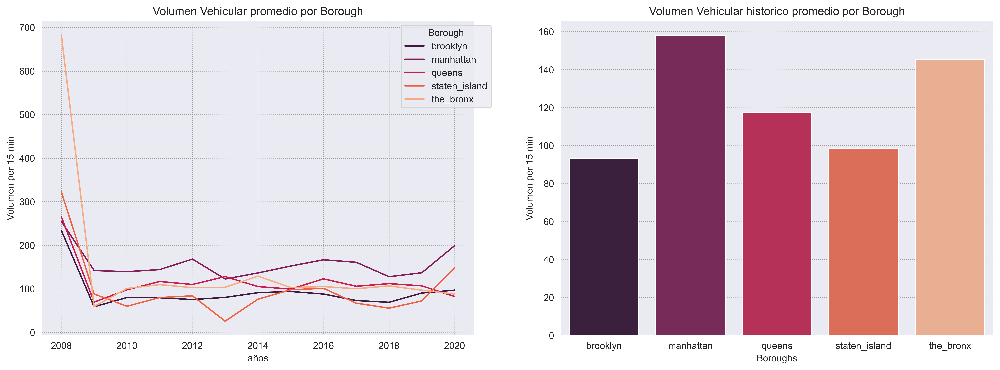

In [36]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})# Tema para de backgroung grafs

#Graficas

# Se crea Subplot de 1*2

fig, ax = plt.subplots(1, 2, figsize=(18, 6),dpi=600)

# Gráfico 1 Densidad de Trafico promedio por Borough

sns.lineplot(x="date", y="volume", data=volumen_vehicular1,  hue='borough', ax=ax[0], markers=True, palette="rocket")

    # Etiquetas
ax[0].set_xlabel('años')
ax[0].set_ylabel('Volumen per 15 min')
ax[0].set_title('Volumen Vehicular promedio por Borough')
    # Leyenda
ax[0].legend(title='Borough', loc='upper right', bbox_to_anchor=(1.05, 1)) 


# Gráfico 2 Densidad de Trafico promedio por Borough

sns.barplot(x="borough", y="volume", data=volumen_vehicular2,   ax=ax[1], palette="rocket")

    # Etiquetas
ax[1].set_xlabel('Boroughs')
ax[1].set_ylabel('Volumen per 15 min')
ax[1].set_title('Volumen Vehicular historico promedio por Borough')

plt.show()

# Se exportan Dataframes

In [164]:
air_quality_out=air_quality

In [165]:
# Se renombran columnas

air_quality_out.columns=['id_cd','cd_name','borough','date','pm 2.5','data_value','air_quality']


air_quality_out['id_borough'] = air_quality_out['borough'].apply(lambda x:2 if x == 'brooklyn' else 
                                                      (1 if x=='manhattan' else 
                                                      (3 if x=='queens' else 
                                                      (5 if x=='staten_island' else 
                                                      (4 if x=='the_bronx'  else None)))))
# PM 2.5 

air_quality_out['pm 2.5'] = air_quality_out['data_value']

# Se eliminan columnas
air_quality_out.drop( 'data_value', inplace=True, axis=1)
air_quality_out=air_quality.reset_index(drop=True)

#Se Reordenan las columnas
air_quality_out = air_quality_out.iloc[:,[3,0,1,6,2,4,5]]

In [226]:
#air_quality_out.to_csv('../data/finale_dataset/air_quality.csv')                                #Dataset 4
#volumen_vehicular.to_csv('../data/finale_dataset/vehicular_volume.csv')                         #Dataset 5

# Correlación trafico/calidad de aire

In [38]:
traffic_corr=densidad_vehicular
air_corr=air_quality

In [39]:
# Air 

air_corr['date']=air_corr['date'].dt.year

air_corr=air_corr.groupby(['borough', 'date']).data_value.mean().reset_index()

In [40]:
# Traffic

#traffic_corr['date']=traffic_corr['date'].dt.year

traffic_corr=traffic_corr.groupby(['borough', 'date']).Volumen_per_15min.mean().reset_index()

In [41]:
# Se concatenan dataframes

correlacion=pd.concat([traffic_corr, air_corr], axis=1)

correlacion = correlacion.iloc[:,[0,1,5,2,3,4]]

correlacion=correlacion.iloc[:, 0:4]

correlacion.rename(columns={'data_value': 'pm 2.5 µg/cm3'}, inplace=True)

correlacion.head(3)

,borough,date,pm 2.5 µg/cm3,Volumen_per_15min
0,brooklyn,2008,11.811111,234.226782
1,brooklyn,2009,10.270000,59.030317
2,brooklyn,2010,11.661852,80.172280


                   pm 2.5 µg/cm3  Volumen_per_15min
pm 2.5 µg/cm3           1.000000           0.405475
Volumen_per_15min       0.405475           1.000000
 
La correlación que existe entre los contaminantes de material particulado PM 2.5 con el volumen de trafico es del 40%


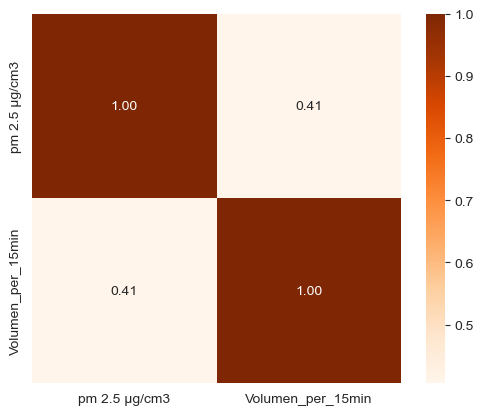

In [42]:

correlation = correlacion[['pm 2.5 µg/cm3', 'Volumen_per_15min']].corr()

print(f'{correlation}\n \nLa correlación que existe entre los contaminantes de material particulado PM 2.5 con el volumen de trafico es del 40%')

sns.heatmap(correlation, vmax=1, square=True, cmap="Oranges",fmt='.2f', annot=True,)
plt.show()

                                                          Devoloped by:
<a href="https://www.linkedin.com/in/jospinoponce/"><img alt="Jaime" title="Connect with Jaime" src="https://img.shields.io/badge/Jaime Ospino-0077B5?style=flat&logo=Linkedin&logoColor=white"></a> 